**Aim: The aim of this notebook is to predict wind power that could be generated from the windmill for the next 15 days**

## Approach:

This is a learning project, where I want to use TensorFlow for doing Time Series Project. 

Algorithms tried:
1. 

## Import statements

In [2]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

# to display all columns
pd.options.display.max_columns = None
pd.options.display.max_rows = None

## Read the data

In [3]:
# read the data
data = pd.read_csv('../input/wind-power-forecasting/Turbine_Data.csv')
data.head()

,Unnamed: 0,ActivePower,AmbientTemperatue,BearingShaftTemperature,Blade1PitchAngle,Blade2PitchAngle,Blade3PitchAngle,ControlBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,GeneratorRPM,GeneratorWinding1Temperature,GeneratorWinding2Temperature,HubTemperature,MainBoxTemperature,NacellePosition,ReactivePower,RotorRPM,TurbineStatus,WTG,WindDirection,WindSpeed
0,2017-12-31 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
1,2017-12-31 00:10:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
2,2017-12-31 00:20:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
3,2017-12-31 00:30:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
4,2017-12-31 00:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN


We see that the data is populated at intervals of 10 minutes. 

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118224 entries, 0 to 118223
Data columns (total 22 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Unnamed: 0                    118224 non-null  object 
 1   ActivePower                   94750 non-null   float64
 2   AmbientTemperatue             93817 non-null   float64
 3   BearingShaftTemperature       62518 non-null   float64
 4   Blade1PitchAngle              41996 non-null   float64
 5   Blade2PitchAngle              41891 non-null   float64
 6   Blade3PitchAngle              41891 non-null   float64
 7   ControlBoxTemperature         62160 non-null   float64
 8   GearboxBearingTemperature     62540 non-null   float64
 9   GearboxOilTemperature         62438 non-null   float64
 10  GeneratorRPM                  62295 non-null   float64
 11  GeneratorWinding1Temperature  62427 non-null   float64
 12  GeneratorWinding2Temperature  62449 non-null

In [5]:
data.describe()

,ActivePower,AmbientTemperatue,BearingShaftTemperature,Blade1PitchAngle,Blade2PitchAngle,Blade3PitchAngle,ControlBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,GeneratorRPM,GeneratorWinding1Temperature,GeneratorWinding2Temperature,HubTemperature,MainBoxTemperature,NacellePosition,ReactivePower,RotorRPM,TurbineStatus,WindDirection,WindSpeed
count,94750.000000,93817.000000,62518.000000,41996.000000,41891.000000,41891.000000,62160.0,62540.000000,62438.000000,62295.000000,62427.000000,62449.000000,62406.000000,62507.000000,72278.000000,94748.000000,62127.000000,6.290800e+04,72278.000000,94595.000000
mean,619.109805,28.774654,43.010189,9.749641,10.036535,10.036535,0.0,64.234170,57.561217,1102.026269,72.460403,71.826659,36.897978,39.547603,196.290539,88.133966,9.907500,2.280429e+03,196.290539,5.878960
std,611.275373,4.369145,5.545312,20.644828,20.270465,20.270465,0.0,10.455556,6.323895,528.063946,22.627489,22.650255,5.178711,5.732783,88.296554,116.596725,4.718421,3.586034e+05,88.296554,2.619084
min,-38.524659,0.000000,0.000000,-43.156734,-26.443415,-26.443415,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-203.182591,0.000000,0.000000e+00,0.000000,0.000000
25%,79.642258,25.627428,39.840247,-0.939849,-0.433264,-0.433264,0.0,57.872242,53.942181,1029.812177,55.492241,54.763998,33.943949,35.812500,145.000000,-0.432137,9.231091,2.000000e+00,145.000000,3.823330
50%,402.654893,28.340541,42.910877,0.394399,0.888977,0.888977,0.0,64.834662,57.196089,1124.860720,65.788800,65.004946,37.003815,39.491310,182.000000,35.883659,10.098702,2.000000e+00,182.000000,5.557765
75%,1074.591780,31.664772,47.007976,8.099302,8.480194,8.480194,0.0,71.079306,61.305312,1515.402005,85.867449,85.337740,40.008425,43.359375,271.000000,147.359075,13.600413,2.000000e+00,271.000000,7.506710
max,1779.032433,42.405597,55.088655,90.143610,90.017830,90.017830,0.0,82.237932,70.764581,1809.941700,126.773031,126.043018,47.996185,54.250000,357.000000,403.713620,16.273495,6.574653e+07,357.000000,22.970893


## Preprocessing

1. The column `Unnanmed: 0` looks to be a date column. Let's change the type to datetime. 

2. Looking closely at df.describe(), we can see that `Blade2PitchAngle` and `Blade3PitchAngle` are having same values. We will validate this by `df1['col'].equals(df2['col']`, and if both are equal, we will drop one of the columns.

In [6]:
# change the Unnamed: 0 to datetype
df_updated = data.copy()
df_updated['Unnamed: 0'] = pd.to_datetime(df_updated['Unnamed: 0'])
df_updated.rename(columns={'Unnamed: 0': 'date_column'}, inplace=True)

if (df_updated['Blade2PitchAngle'].equals(df_updated['Blade3PitchAngle'])==True):
  df_updated = df_updated.drop('Blade3PitchAngle', axis=1) 

# check if the column is dropped
assert 'Blade3PitchAngle' not in df_updated.columns

In [7]:
df_updated.head()

,date_column,ActivePower,AmbientTemperatue,BearingShaftTemperature,Blade1PitchAngle,Blade2PitchAngle,ControlBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,GeneratorRPM,GeneratorWinding1Temperature,GeneratorWinding2Temperature,HubTemperature,MainBoxTemperature,NacellePosition,ReactivePower,RotorRPM,TurbineStatus,WTG,WindDirection,WindSpeed
0,2017-12-31 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
1,2017-12-31 00:10:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
2,2017-12-31 00:20:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
3,2017-12-31 00:30:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN
4,2017-12-31 00:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,G01,NaN,NaN


## Check for null values

In [8]:
# Check null values
df_updated.isnull().sum()

date_column                         0
ActivePower                     23474
AmbientTemperatue               24407
BearingShaftTemperature         55706
Blade1PitchAngle                76228
Blade2PitchAngle                76333
ControlBoxTemperature           56064
GearboxBearingTemperature       55684
GearboxOilTemperature           55786
GeneratorRPM                    55929
GeneratorWinding1Temperature    55797
GeneratorWinding2Temperature    55775
HubTemperature                  55818
MainBoxTemperature              55717
NacellePosition                 45946
ReactivePower                   23476
RotorRPM                        56097
TurbineStatus                   55316
WTG                                 0
WindDirection                   45946
WindSpeed                       23629
dtype: int64

**To do**:
How to handle the missing data here:

1. Populate the NaN values by `df.fillna(method='ffill')`
2. Populate the missing values by median value/ average value? (or moving average value)



In [9]:
df_updated = df_updated.fillna(method='ffill').fillna(method='bfill')
df_updated.isnull().sum()

date_column                     0
ActivePower                     0
AmbientTemperatue               0
BearingShaftTemperature         0
Blade1PitchAngle                0
Blade2PitchAngle                0
ControlBoxTemperature           0
GearboxBearingTemperature       0
GearboxOilTemperature           0
GeneratorRPM                    0
GeneratorWinding1Temperature    0
GeneratorWinding2Temperature    0
HubTemperature                  0
MainBoxTemperature              0
NacellePosition                 0
ReactivePower                   0
RotorRPM                        0
TurbineStatus                   0
WTG                             0
WindDirection                   0
WindSpeed                       0
dtype: int64

In [10]:
df = df_updated[['date_column', 'ActivePower', 'WindSpeed', 'GeneratorRPM', 'ReactivePower', 'RotorRPM', 'AmbientTemperatue', \
                 'WindDirection', 'Blade1PitchAngle', 'Blade2PitchAngle', 'HubTemperature', 'MainBoxTemperature', 'GearboxBearingTemperature', \
                 'GearboxOilTemperature']].copy()

In [11]:
# crete a new column called Weekday
df['weekday'] = df['date_column'].dt.dayofweek
# get one hot encoding
ohe = pd.get_dummies(df['weekday'])
df = df.join(ohe)
df = df.drop('weekday', axis=1)
date = pd.to_datetime(df.pop('date_column'))
df.head()

,ActivePower,WindSpeed,GeneratorRPM,ReactivePower,RotorRPM,AmbientTemperatue,WindDirection,Blade1PitchAngle,Blade2PitchAngle,HubTemperature,MainBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,0,1,2,3,4,5,6
0,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1
1,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1
2,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1
3,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1
4,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1


## Date column
  * The `date` column in string format is not a useful input. 
  * It could have clear daily and yearly periodicity.
  * Use `sin` and `cos` to convert the time to clear "Time of day" and "Time of  year signals.

In [12]:
# convert datetime column to seconds
import datetime
timestamp_s = date.map(datetime.datetime.timestamp)

In [13]:
# time in seconds may not be an useful input. We could convert it into sin and cos
day = 24*60*60
year = (365.2425)*day

df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

In [14]:
df.head()

,ActivePower,WindSpeed,GeneratorRPM,ReactivePower,RotorRPM,AmbientTemperatue,WindDirection,Blade1PitchAngle,Blade2PitchAngle,HubTemperature,MainBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,0,1,2,3,4,5,6,Day sin,Day cos,Year sin,Year cos
0,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,-6.688386e-12,1.000000,-0.011010,0.999939
1,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,4.361939e-02,0.999048,-0.010890,0.999941
2,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,8.715574e-02,0.996195,-0.010771,0.999942
3,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,1.305262e-01,0.991445,-0.010651,0.999943
4,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,1.736482e-01,0.984808,-0.010532,0.999945


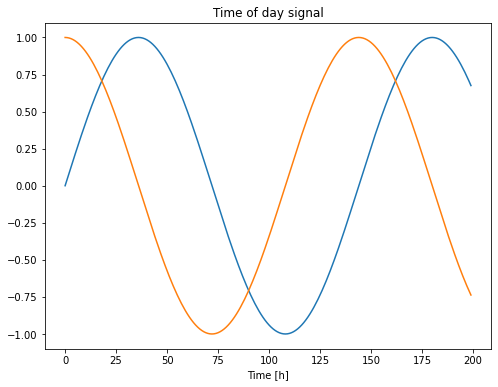

In [15]:
plt.plot(np.array(df['Day sin'])[:200])
plt.plot(np.array(df['Day cos'])[:200])
plt.xlabel('Time [h]')
plt.title('Time of day signal');

## Split the data

* We will use `70%, 20%, 10%` split for the training, validation and test sets.

* Data is not randomly sampled before splitting:
  * Chopping the data into windows of consecutive samples is still possible.
  * Ensures that validation/test sets are more realistic.

In [16]:
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]

In [17]:
df.head()

,ActivePower,WindSpeed,GeneratorRPM,ReactivePower,RotorRPM,AmbientTemperatue,WindDirection,Blade1PitchAngle,Blade2PitchAngle,HubTemperature,MainBoxTemperature,GearboxBearingTemperature,GearboxOilTemperature,0,1,2,3,4,5,6,Day sin,Day cos,Year sin,Year cos
0,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,-6.688386e-12,1.000000,-0.011010,0.999939
1,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,4.361939e-02,0.999048,-0.010890,0.999941
2,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,8.715574e-02,0.996195,-0.010771,0.999942
3,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,1.305262e-01,0.991445,-0.010651,0.999943
4,-5.357727,2.279088,1751.715563,-9.96083,15.708135,23.148729,8.0,45.736893,43.699357,42.996094,41.898426,77.119133,64.204399,0,0,0,0,0,0,1,1.736482e-01,0.984808,-0.010532,0.999945


## Normalize the data

* It is important to scale features before training a Neural Network
* Normalization = Subtract the mean and divide by the standard deviation of each feature.

* **thinktank**: normalization could be done using moving averages.

In [18]:
# Normalize the data
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

Visualize the distribution

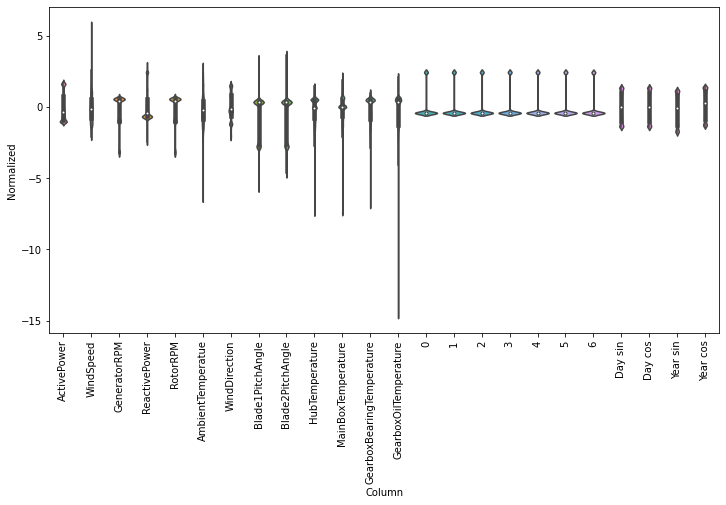

In [19]:
# the code below visualizes the normalized data
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

## Data Windowing

* Models will make predictions based on a window of consecutive samples from the data
* The main features of the input windows are:
  * The width (number of timesteps) of the input and label windows
  * The time offset between them
  * Which features are used as inputs, labels, or both.

#### Indexes and offset

In [20]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift
    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

* In our case, we want to predict 15 days into the future. 
* input_width = `30*24*6`
* label_with = `30*24*6`
* shift = 1

In [21]:
w2 = WindowGenerator(input_width=30*24*6, label_width=15*24*6, shift=15*24*6,
                     label_columns=['ActivePower'])

w2

Total window size: 6480
Input indices: [   0    1    2 ... 4317 4318 4319]
Label indices: [4320 4321 4322 ... 6477 6478 6479]
Label column name(s): ['ActivePower']

## Split

* Given a list of consecutive inputs, the `split_window` method will convert them to a window of inputs and a window of labels. 

In [22]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [23]:
# Stack three slices, the length of the total window:
example_window = tf.stack([np.array(train_df[:w2.total_window_size]),
                           np.array(train_df[100:100+w2.total_window_size]),
                           np.array(train_df[200:200+w2.total_window_size])])


example_inputs, example_labels = w2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'labels shape: {example_labels.shape}')

All shapes are: (batch, time, features)
Window shape: (3, 6480, 24)
Inputs shape: (3, 4320, 24)
labels shape: (3, 2160, 1)


* This example takes a batch of 3, 4320 timestep windows, with 24 features at each timestep. 
* It splits them into a batch of 2160 timestep, 24 feature inputs, and a 2160 timestep, 1 feature output label. 
* The label only has one feature, because the `WindowGenerator` was initialized with one column. 

## Plot

* A plot method that allows a simple visualization of the split window

In [24]:
w2.example = example_inputs, example_labels

In [25]:
def plot(self, model=None, plot_col='ActivePower', max_subplots=5):
  inputs, labels = self.example
  plt.figure(figsize=(70, 20))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=124)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', label='Predictions',
                  c='#ff0000', s=154)

    if n == 0:
      plt.legend(prop={'size': 20})

  plt.xlabel('Time [20 min]')

WindowGenerator.plot = plot

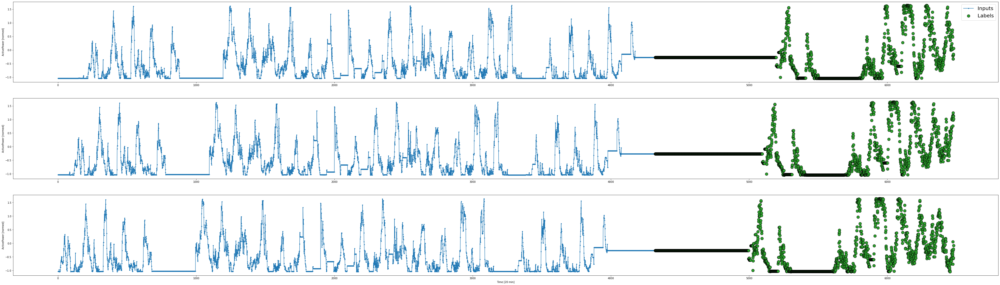

In [26]:
w2.plot()

## Create tf.Datasets 
* The `make_dataset` method below will take a timeseries DataFrame and convert it to a `tf.data.Dataset` of (input_window, label_window) pairs using the `preprocessing.timeseries_dataset_from_array` function.

In [27]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=120,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

The `WindowGenerator` ibhect holds training, validation, and test data. Add properties for accessing them using the above `make_dataset` method. Also, add a standard example batch for easy access and plotting. 

In [28]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [29]:
# Each element is an (inputs, label) pair
w2.train.element_spec

(TensorSpec(shape=(None, 4320, 24), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 2160, 1), dtype=tf.float32, name=None))

Iterating over a dataset yields concrete batches. 

In [30]:
for example_inputs, example_labels in w2.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (120, 4320, 24)
Labels shape (batch, time, features): (120, 2160, 1)


In [31]:
wide_window = WindowGenerator(
    input_width=2*6, label_width=2*6, shift=1,
    label_columns=['ActivePower'])

wide_window

Total window size: 13
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12]
Label column name(s): ['ActivePower']

## Compile and fit

In [32]:
# package the training into a function
MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=3):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=3,
                                                    mode='min')

  model.compile(loss=tf.losses.MeanAbsoluteError(),
                optimizer=tf.optimizers.Adam(lr=0.01),
                metrics=[tf.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history


### Multi step model

* We want to predict multiple steps into the future (15 days into the future)

* In multi-step prediction, the model needs to learn to predict a range of future values. A sequence of future values are predicted. 

* **Two approaches**:

1. Single shot predictions where the entire timeseries is predicted at once
2. AutoRegressive model: the model makes only single step predictions and its output is fed back as input. 

Here's a window object that generates these slices from the dataset

Total window size: 4320
Input indices: [   0    1    2 ... 2157 2158 2159]
Label indices: [2160 2161 2162 ... 4317 4318 4319]
Label column name(s): None

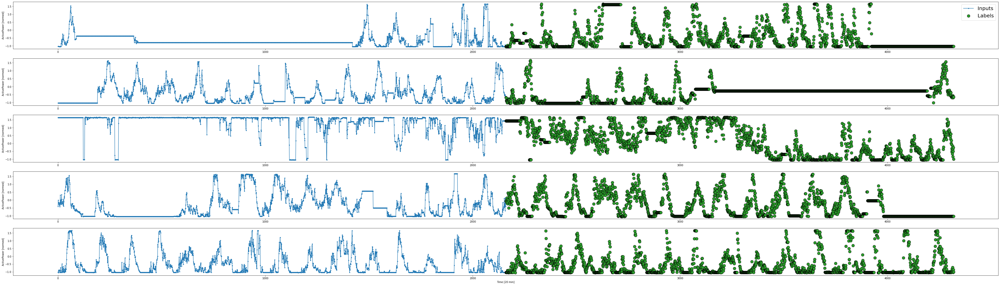

In [33]:
OUT_STEPS = 15*24*6
multi_window = WindowGenerator(input_width=15*24*6,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS)

multi_window.plot()
multi_window


#### Baseline model

##### Repeat last input: A simple baseline is to repeat the last input timestep for the required number of output timesteps. 

63/63 [==============================] - 5s 74ms/step - loss: 0.7966 - mean_absolute_error: 0.7966


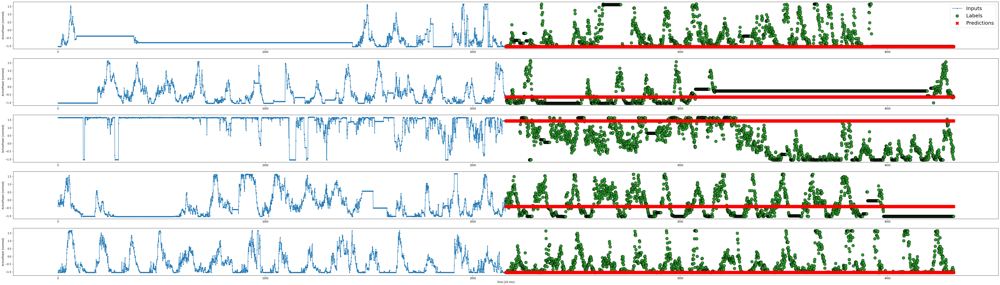

In [34]:
class MultiStepLastBaseline(tf.keras.Model):
  def call(self, inputs):
    return tf.tile(inputs[:, -1:, :], [1, OUT_STEPS, 1])

last_baseline = MultiStepLastBaseline()
last_baseline.compile(loss=tf.losses.MeanAbsoluteError(),
                      metrics=[tf.metrics.MeanAbsoluteError()])

multi_val_performance = {}
multi_performance = {}

multi_val_performance['Last'] = last_baseline.evaluate(multi_window.val)
multi_performance['Last'] = last_baseline.evaluate(multi_window.test)
multi_window.plot(last_baseline)


Repeat Baseline: Repeat previous 15 days, assuming the next 15 days will be similar.

63/63 [==============================] - 5s 70ms/step - loss: 0.6261 - mean_absolute_error: 0.6261


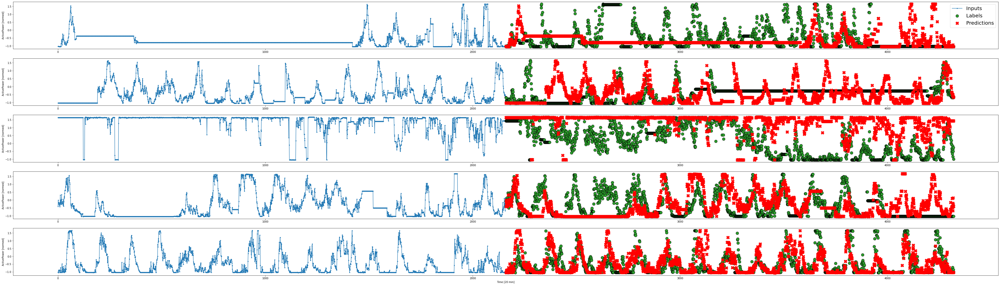

In [35]:
class RepeatBaseline(tf.keras.Model):
  def call(self, inputs):
    return inputs

repeat_baseline = RepeatBaseline()
repeat_baseline.compile(loss=tf.losses.MeanAbsoluteError(),
                        metrics=[tf.metrics.MeanAbsoluteError()])

multi_val_performance['Repeat'] = repeat_baseline.evaluate(multi_window.val)
multi_performance['Repeat'] = repeat_baseline.evaluate(multi_window.test)
multi_window.plot(repeat_baseline)


### Single shot model

* The model makes the entire sequence prediction in one step
* Model only needs to reshape the output

#### Linear model

* `multi_linear_model`: 
  
  * Groups a linear stack of layers into a `tf.keras.Model`. 

Total window size: 6480
Input indices: [   0    1    2 ... 4317 4318 4319]
Label indices: [4320 4321 4322 ... 6477 6478 6479]
Label column name(s): None

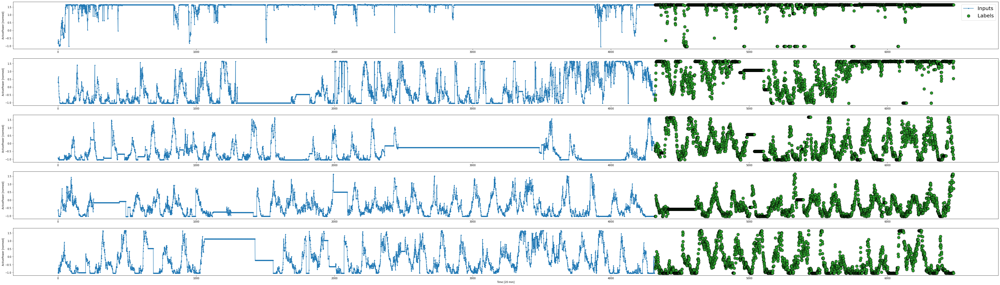

In [36]:
OUT_STEPS = 15*24*6
multi_window = WindowGenerator(input_width=30*24*6,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS)

multi_window.plot()
multi_window


Epoch 1/20
636/636 [==============================] - 98s 153ms/step - loss: 0.3754 - mean_absolute_error: 0.3754 - val_loss: 0.6207 - val_mean_absolute_error: 0.6207
Epoch 2/20
636/636 [==============================] - 97s 152ms/step - loss: 0.2980 - mean_absolute_error: 0.2980 - val_loss: 0.6183 - val_mean_absolute_error: 0.6183
Epoch 3/20
636/636 [==============================] - 97s 152ms/step - loss: 0.2981 - mean_absolute_error: 0.2981 - val_loss: 0.6187 - val_mean_absolute_error: 0.6187
Epoch 4/20
636/636 [==============================] - 94s 148ms/step - loss: 0.2981 - mean_absolute_error: 0.2981 - val_loss: 0.6224 - val_mean_absolute_error: 0.6224
Epoch 5/20
45/45 [==============================] - 5s 105ms/step - loss: 0.4921 - mean_absolute_error: 0.4921


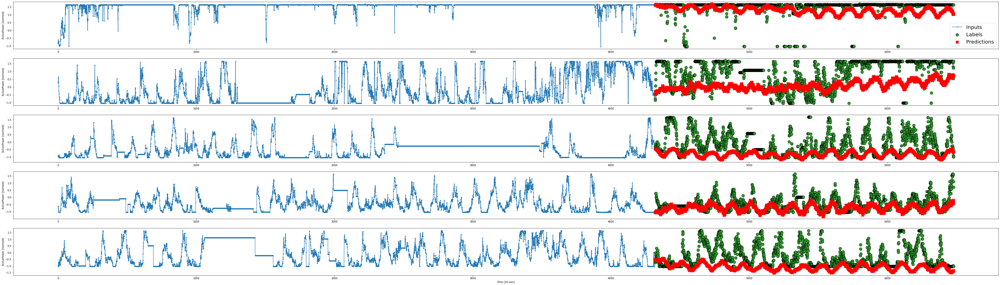

In [37]:
multi_linear_model = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_linear_model, multi_window)

#IPython.display.clear_output()
multi_val_performance['Linear'] = multi_linear_model.evaluate(multi_window.val)
multi_performance['Linear'] = multi_linear_model.evaluate(multi_window.test)
multi_window.plot(multi_linear_model)


This model does better than baseline, but still underpowered. (Also we haven't made use of other feature columns).

#### Dense
* Add layers.dense  between the input and output

Epoch 1/20
636/636 [==============================] - 94s 147ms/step - loss: 0.3112 - mean_absolute_error: 0.3112 - val_loss: 0.6895 - val_mean_absolute_error: 0.6895
Epoch 2/20
636/636 [==============================] - 92s 145ms/step - loss: 0.2280 - mean_absolute_error: 0.2280 - val_loss: 0.7994 - val_mean_absolute_error: 0.7994
Epoch 3/20
636/636 [==============================] - 92s 145ms/step - loss: 0.2182 - mean_absolute_error: 0.2182 - val_loss: 0.9158 - val_mean_absolute_error: 0.9158
Epoch 4/20
45/45 [==============================] - 5s 108ms/step - loss: 1.1859 - mean_absolute_error: 1.1859


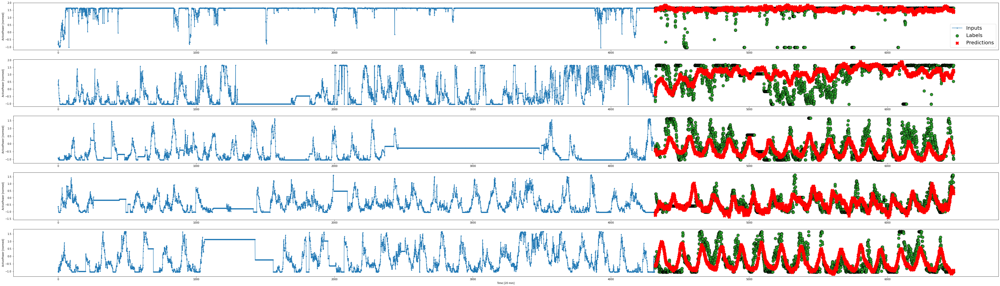

In [38]:
multi_dense_model = tf.keras.Sequential([
    # Take the last time step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
    # Shape => [batch, 1, dense_units]
    tf.keras.layers.Dense(512, activation='relu'),
    # Shape => [batch, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_dense_model, multi_window)

multi_val_performance['Dense'] = multi_dense_model.evaluate(multi_window.val)
multi_performance['Dense'] = multi_dense_model.evaluate(multi_window.test)
multi_window.plot(multi_dense_model)


#### CNN

Epoch 1/20
636/636 [==============================] - 103s 157ms/step - loss: 0.3186 - mean_absolute_error: 0.3186 - val_loss: 0.6791 - val_mean_absolute_error: 0.6791
Epoch 2/20
636/636 [==============================] - 100s 157ms/step - loss: 0.2391 - mean_absolute_error: 0.2391 - val_loss: 0.7909 - val_mean_absolute_error: 0.7909
Epoch 3/20
636/636 [==============================] - 91s 143ms/step - loss: 0.2319 - mean_absolute_error: 0.2319 - val_loss: 0.8987 - val_mean_absolute_error: 0.8987
Epoch 4/20
45/45 [==============================] - 5s 100ms/step - loss: 1.2686 - mean_absolute_error: 1.2686


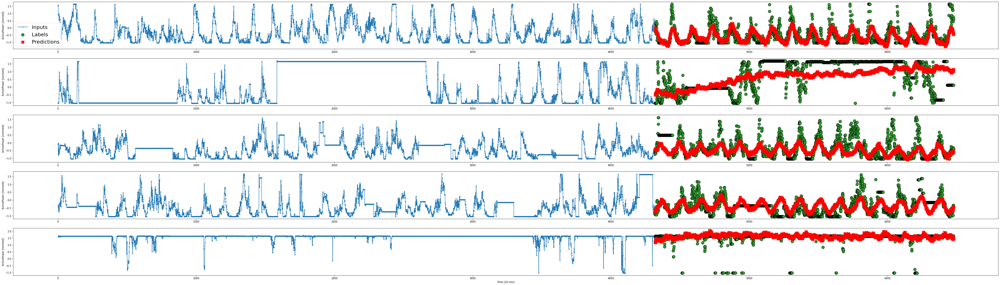

In [48]:
CONV_WIDTH = 3
multi_conv_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Shape => [batch, 1, conv_units]
    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),
    # Shape => [batch, 1,  out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_conv_model, multi_window)

multi_val_performance['Conv'] = multi_conv_model.evaluate(multi_window.val)
multi_performance['Conv'] = multi_conv_model.evaluate(multi_window.test)
multi_window.plot(multi_conv_model)


#### RNN

Epoch 1/20
636/636 [==============================] - 202s 313ms/step - loss: 0.3993 - mean_absolute_error: 0.3993 - val_loss: 0.7119 - val_mean_absolute_error: 0.7119
Epoch 2/20
636/636 [==============================] - 197s 310ms/step - loss: 0.3092 - mean_absolute_error: 0.3092 - val_loss: 0.7268 - val_mean_absolute_error: 0.7268
Epoch 3/20
636/636 [==============================] - 198s 312ms/step - loss: 0.3019 - mean_absolute_error: 0.3019 - val_loss: 0.7237 - val_mean_absolute_error: 0.7237
Epoch 4/20
45/45 [==============================] - 9s 185ms/step - loss: 0.6424 - mean_absolute_error: 0.6424


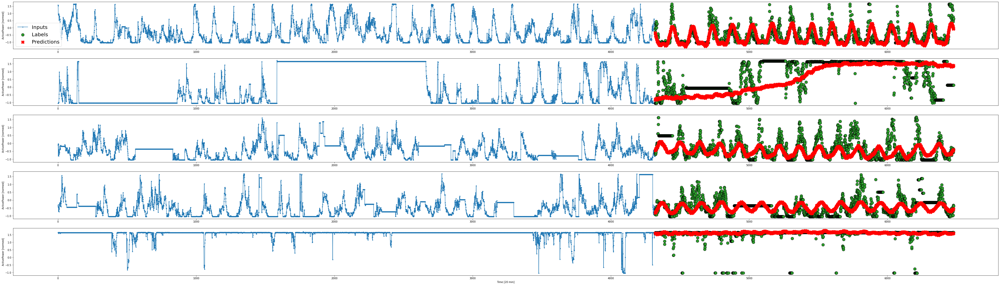

In [49]:
multi_lstm_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, lstm_units]
    # Adding more `lstm_units` just overfits more quickly.
    tf.keras.layers.LSTM(32, return_sequences=False),
    # Shape => [batch, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_lstm_model, multi_window)

multi_val_performance['LSTM'] = multi_lstm_model.evaluate(multi_window.val)
multi_performance['LSTM'] = multi_lstm_model.evaluate(multi_window.test)
multi_window.plot(multi_lstm_model)


**Improvements/ future development**

* Add more layers to RNN/CNN

* Try Autoregressive model

* Create custom evaluation metric:
  * to give more weightage to the closest predictions

* Feature engineering + apply the known datafields to future dates which are fed to the predict function. 
